In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import tensorflow as tf
print(tf.__version__)

def eval_metrics(actual, pred):
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\n","mae:", mae, "\n","mse:",mse, "\n","rmse:",rmse)

2.4.0


In [2]:
df = pd.read_csv('kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [3]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [5]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


/Users/me/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

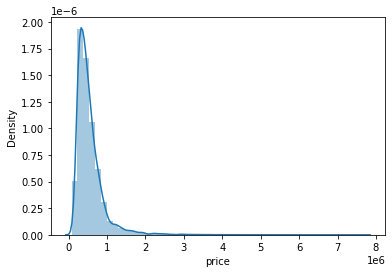

In [6]:
sns.distplot(df['price'])

/Users/me/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='bedrooms', ylabel='count'>

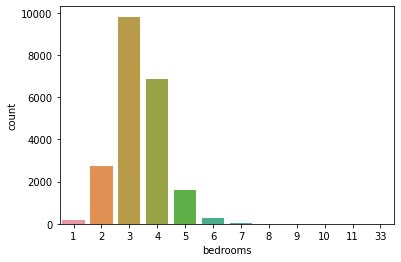

In [7]:
sns.countplot(df['bedrooms'])

In [8]:
df['bedrooms'].value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

In [9]:
df[df['bedrooms']==33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15856,2402100895,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,...,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [10]:
df.corr()['price'].sort_values()

zipcode         -0.053
id              -0.017
long             0.022
condition        0.036
yr_built         0.054
sqft_lot15       0.083
sqft_lot         0.090
yr_renovated     0.126
floors           0.257
waterfront       0.266
lat              0.307
bedrooms         0.309
sqft_basement    0.324
view             0.397
bathrooms        0.526
sqft_living15    0.585
sqft_above       0.605
grade            0.668
sqft_living      0.702
price            1.000
Name: price, dtype: float64

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

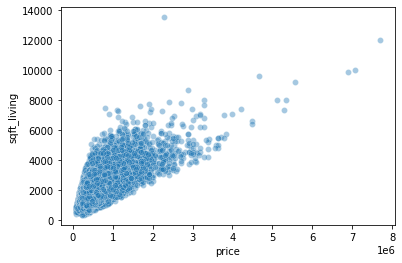

In [11]:
sns.scatterplot(x='price',y='sqft_living',data=df,alpha=0.4,estimator='std',ci=90)

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

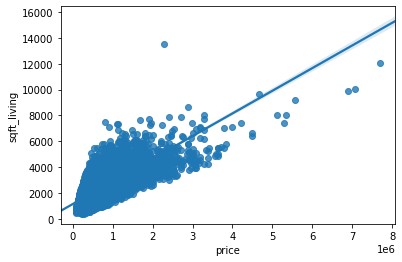

In [12]:
sns.regplot(x='price',y='sqft_living',data=df,truncate=False)

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

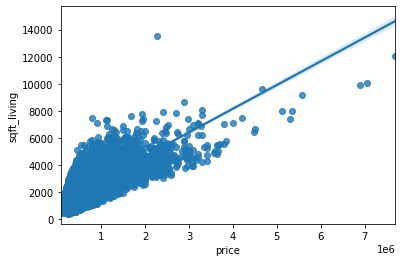

In [13]:
sns.regplot(x='price',y='sqft_living',data=df,truncate=True)

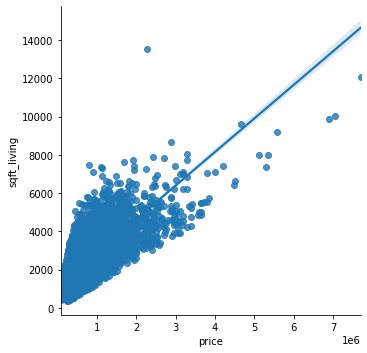

In [14]:
sns.lmplot(x='price',y='sqft_living',data=df)

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

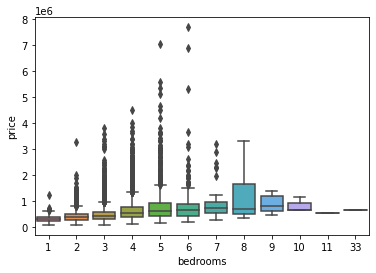

In [15]:
sns.boxplot(x='bedrooms',y='price',data=df)

<AxesSubplot:xlabel='price', ylabel='long'>

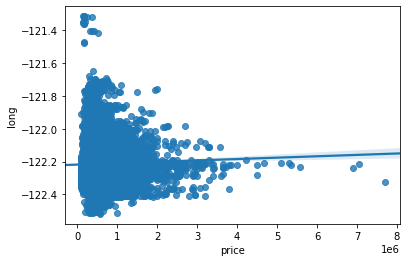

In [16]:
sns.regplot(x='price',y='long',data=df,truncate=False)

<AxesSubplot:xlabel='price', ylabel='lat'>

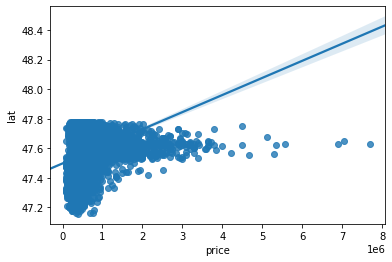

In [17]:
sns.regplot(x='price',y='lat',data=df,truncate=False)

<AxesSubplot:xlabel='long', ylabel='lat'>

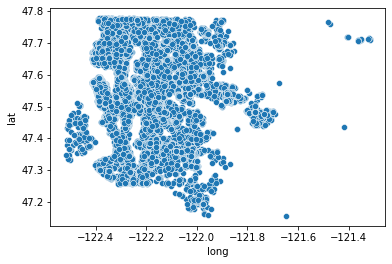

In [18]:
sns.scatterplot(x='long',y='lat',data=df)

In [19]:
import folium
folium.Map(location=[df["lat"].mean(),df["long"].mean()], zoom_start=8)

In [20]:
map_kc = folium.Map(location=[47.511,  -122.257], zoom_start=10)
for lat, lng in zip(df['lat'], df['long']):
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        color='blue',
        fill=False,
        fill_color='#3186CC',
        fill_opacity=0.1).add_to(map_kc)
map_kc

In [21]:
df.sort_values('price',ascending=False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,...,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,...,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,...,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,...,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,...,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,...,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,...,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,...,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,...,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,...,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [22]:
len(df) * 0.01

215.97

In [23]:
df.sort_values('price',ascending=False).iloc[216:]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6329,824059321,6/2/2014,1970000.000,4,3.500,4370,8510,2.000,0,1,...,10,3610,760,2003,0,98004,47.588,-122.204,2960,10347
12271,1923000260,10/15/2014,1960000.000,5,4.500,6200,23373,3.000,0,1,...,11,5050,1150,1988,0,98040,47.563,-122.215,3700,14486
9166,3124059023,2/13/2015,1960000.000,3,1.750,3330,12566,1.000,1,4,...,8,1940,1390,1960,0,98040,47.529,-122.220,3730,16560
12565,2806300065,4/22/2015,1960000.000,4,4.000,4430,31353,2.000,0,0,...,12,4430,0,1998,0,98005,47.642,-122.157,3900,35237
1150,4055701200,4/21/2015,1960000.000,4,2.750,3120,7898,1.000,1,4,...,8,1560,1560,1963,0,98034,47.717,-122.259,2630,13868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,1623049041,5/8/2014,82500.000,2,1.000,520,22334,1.000,0,0,...,5,520,0,1951,0,98168,47.480,-122.296,1572,10570
8267,3883800011,11/5/2014,82000.000,3,1.000,860,10426,1.000,0,0,...,6,860,0,1954,0,98146,47.499,-122.341,1140,11250
16184,3028200080,3/24/2015,81000.000,2,1.000,730,9975,1.000,0,0,...,5,730,0,1943,0,98168,47.481,-122.315,860,9000
465,8658300340,5/23/2014,80000.000,1,0.750,430,5050,1.000,0,0,...,4,430,0,1912,0,98014,47.650,-121.909,1200,7500


<AxesSubplot:xlabel='long', ylabel='lat'>

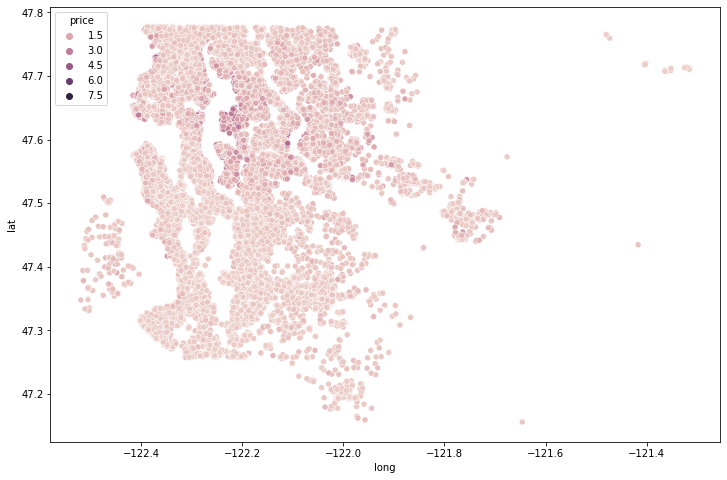

In [24]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat',data=df,hue='price')

<AxesSubplot:xlabel='long', ylabel='lat'>

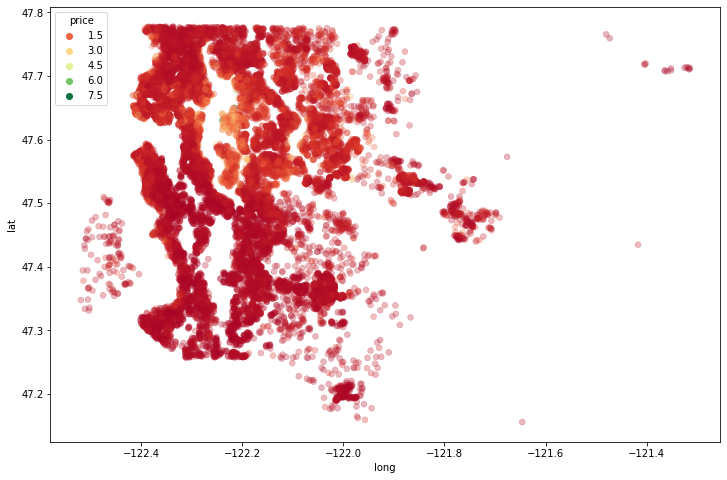

In [25]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat',data=df,hue='price',palette="RdYlGn",alpha=0.3, edgecolor=None)

In [26]:
!which python3

/Users/me/opt/anaconda3/bin/python3


<AxesSubplot:xlabel='waterfront', ylabel='price'>

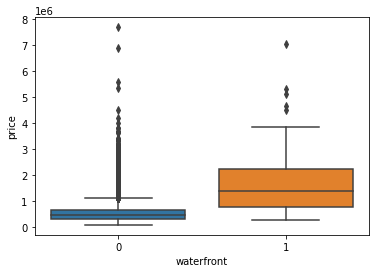

In [27]:
sns.boxplot(x='waterfront',y='price',data=df)

In [28]:
df.drop('id',axis=1,inplace=True)

In [29]:
df['date']= pd.to_datetime(df['date'])

In [30]:
df['month'] = df['date'].apply(lambda x : x.month)
df['year'] = df['date'].apply(lambda x : x.year)

df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month,year
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,...,0,1955,0,98178,47.511,-122.257,1340,5650,10,2014
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,...,400,1951,1991,98125,47.721,-122.319,1690,7639,12,2014
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,...,0,1933,0,98028,47.738,-122.233,2720,8062,2,2015
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,...,910,1965,0,98136,47.521,-122.393,1360,5000,12,2014
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,...,0,1987,0,98074,47.617,-122.045,1800,7503,2,2015


<AxesSubplot:xlabel='year', ylabel='price'>

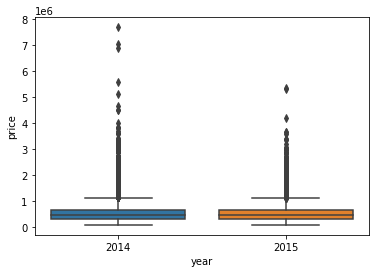

In [31]:
sns.boxplot(x='year',y='price',data=df)

(0.0, 2000000.0)

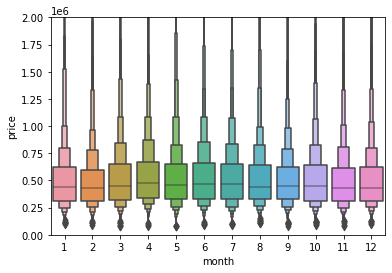

In [32]:
sns.boxenplot(x='month',y='price',data=df)
plt.ylim(0,2000000)

<AxesSubplot:xlabel='month'>

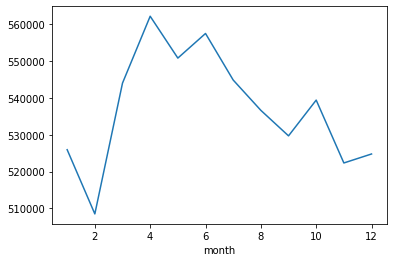

In [33]:
df.groupby('month').mean()['price'].plot()

<AxesSubplot:xlabel='year,month'>

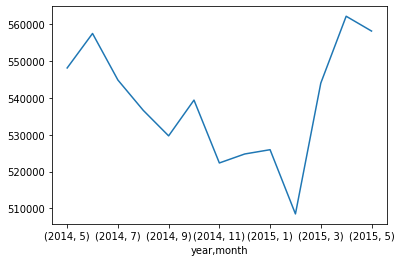

In [34]:
df.groupby(['year','month']).mean()['price'].plot()

In [35]:
df.drop('date',axis=1,inplace=True)

In [36]:
df.drop('zipcode',axis=1,inplace=True)

In [37]:
#yr_renovated if its 0 when we scale it will be still 0 others will come down.
df['yr_renovated'].value_counts()

0       20683
2014       91
2013       37
2003       36
2000       35
        ...  
1934        1
1959        1
1951        1
1948        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [38]:
#sqft_basement if its 0 when we scale it will be still 0 others will come down.
df['sqft_basement'].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
792         1
2590        1
935         1
2390        1
248         1
Name: sqft_basement, Length: 306, dtype: int64

# Scale and Train Test Split

In [39]:
from sklearn.model_selection import train_test_split
X= df.drop('price',axis=1).values
y = df['price'].values
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=42)

from sklearn.preprocessing import MinMaxScaler , RobustScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

robustscaler = RobustScaler()
X_train_robust = robustscaler.fit_transform(X_train)
X_test_robust = robustscaler.transform(X_test)

# Creating Model

In [40]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
def eval_metrics(actual, pred):
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\n","mae:", mae, "\n","mse:",mse, "\n","rmse:",rmse)

In [41]:
X_train.shape

(15117, 19)

In [42]:
early_stop = EarlyStopping(monitor='val_loss',verbose=1, patience=15)
model = Sequential()

model.add(Dense(19, activation='relu')) #input layer
model.add(Dense(19, activation='relu')) #hidden layer 1
model.add(Dense(19, activation='relu')) #hidden layer 2
model.add(Dense(19, activation='relu')) #hidden layer 3
model.add(Dense(1)) #output layer, single since we do a regresion

model.compile(optimizer = 'adam', loss='mse')

model.fit(X_train, y_train,validation_data=(X_test, y_test), 
          batch_size=128, epochs=450,callbacks=[early_stop]) 
print(model.summary())
y_pred = model.predict(X_test)
print(eval_metrics(y_test, y_pred))

Epoch 1/450
119/119 [==============================] - 2s 15ms/step - loss: 437151905382.4000 - val_loss: 420118167552.0000
Epoch 2/450
119/119 [==============================] - 0s 3ms/step - loss: 432243484535.4667 - val_loss: 418329985024.0000
Epoch 3/450
119/119 [==============================] - 0s 3ms/step - loss: 437604075656.5333 - val_loss: 398748811264.0000
Epoch 4/450
119/119 [==============================] - 0s 2ms/step - loss: 408050230886.4000 - val_loss: 316381134848.0000
Epoch 5/450
119/119 [==============================] - 0s 3ms/step - loss: 307180813516.8000 - val_loss: 169896132608.0000
Epoch 6/450
119/119 [==============================] - 0s 3ms/step - loss: 143703663479.4667 - val_loss: 101625511936.0000
Epoch 7/450
119/119 [==============================] - 0s 3ms/step - loss: 102298860066.1333 - val_loss: 97689575424.0000
Epoch 8/450
119/119 [==============================] - 0s 4ms/step - loss: 107170788078.9333 - val_loss: 96301662208.0000
Epoch 9/450
119/1

119/119 [==============================] - 0s 3ms/step - loss: 40880590694.4000 - val_loss: 42496573440.0000
Epoch 69/450
119/119 [==============================] - 0s 3ms/step - loss: 41921619933.8667 - val_loss: 42419400704.0000
Epoch 70/450
119/119 [==============================] - 0s 2ms/step - loss: 38004793804.8000 - val_loss: 42302324736.0000
Epoch 71/450
119/119 [==============================] - 0s 3ms/step - loss: 42722724608.0000 - val_loss: 42356486144.0000
Epoch 72/450
119/119 [==============================] - 0s 2ms/step - loss: 41059253811.2000 - val_loss: 42162679808.0000
Epoch 73/450
119/119 [==============================] - 0s 2ms/step - loss: 39258685132.8000 - val_loss: 42051182592.0000
Epoch 74/450
119/119 [==============================] - 0s 2ms/step - loss: 39260914858.6667 - val_loss: 41992552448.0000
Epoch 75/450
119/119 [==============================] - 0s 2ms/step - loss: 41492742673.0667 - val_loss: 41910218752.0000
Epoch 76/450
119/119 [===============

Epoch 135/450
119/119 [==============================] - 0s 2ms/step - loss: 33252138786.1333 - val_loss: 36982456320.0000
Epoch 136/450
119/119 [==============================] - 0s 2ms/step - loss: 37631543808.0000 - val_loss: 36877176832.0000
Epoch 137/450
119/119 [==============================] - 0s 3ms/step - loss: 33612023142.4000 - val_loss: 36839763968.0000
Epoch 138/450
119/119 [==============================] - 0s 2ms/step - loss: 34722778112.0000 - val_loss: 36776468480.0000
Epoch 139/450
119/119 [==============================] - 0s 2ms/step - loss: 36502427648.0000 - val_loss: 36699754496.0000
Epoch 140/450
119/119 [==============================] - 0s 3ms/step - loss: 36248007253.3333 - val_loss: 36684378112.0000
Epoch 141/450
119/119 [==============================] - 0s 2ms/step - loss: 35562621627.7333 - val_loss: 36616118272.0000
Epoch 142/450
119/119 [==============================] - 0s 2ms/step - loss: 36697376102.4000 - val_loss: 36534468608.0000
Epoch 143/450
11

119/119 [==============================] - 0s 2ms/step - loss: 34032033194.6667 - val_loss: 34594693120.0000
Epoch 202/450
119/119 [==============================] - 0s 2ms/step - loss: 31148018346.6667 - val_loss: 34563440640.0000
Epoch 203/450
119/119 [==============================] - 0s 2ms/step - loss: 32033738120.5333 - val_loss: 34533019648.0000
Epoch 204/450
119/119 [==============================] - 0s 3ms/step - loss: 34067435707.7333 - val_loss: 34494726144.0000
Epoch 205/450
119/119 [==============================] - 0s 2ms/step - loss: 31265279129.6000 - val_loss: 34478477312.0000
Epoch 206/450
119/119 [==============================] - 0s 2ms/step - loss: 31196796910.9333 - val_loss: 34475909120.0000
Epoch 207/450
119/119 [==============================] - 0s 2ms/step - loss: 34564792524.8000 - val_loss: 34406809600.0000
Epoch 208/450
119/119 [==============================] - 0s 2ms/step - loss: 30598593570.1333 - val_loss: 34421915648.0000
Epoch 209/450
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 31255243690.6667 - val_loss: 33328193536.0000
Epoch 268/450
119/119 [==============================] - 0s 2ms/step - loss: 32146301115.7333 - val_loss: 33296414720.0000
Epoch 269/450
119/119 [==============================] - 0s 2ms/step - loss: 30594850013.8667 - val_loss: 33274216448.0000
Epoch 270/450
119/119 [==============================] - 0s 3ms/step - loss: 31703358720.0000 - val_loss: 33266159616.0000
Epoch 271/450
119/119 [==============================] - 0s 2ms/step - loss: 33270774118.4000 - val_loss: 33258039296.0000
Epoch 272/450
119/119 [==============================] - 0s 2ms/step - loss: 30355391436.8000 - val_loss: 33227292672.0000
Epoch 273/450
119/119 [==============================] - 0s 2ms/step - loss: 32118181273.6000 - val_loss: 33213569024.0000
Epoch 274/450
119/119 [==============================] - 0s 2ms/step - loss: 31312815530.6667 - val_loss: 33205925888.0000
Epoch 275/450
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 30298950587.7333 - val_loss: 32578689024.0000
Epoch 334/450
119/119 [==============================] - 0s 2ms/step - loss: 28027603046.4000 - val_loss: 32660754432.0000
Epoch 335/450
119/119 [==============================] - 0s 2ms/step - loss: 30508111854.9333 - val_loss: 32530089984.0000
Epoch 336/450
119/119 [==============================] - 0s 2ms/step - loss: 30633575355.7333 - val_loss: 32505466880.0000
Epoch 337/450
119/119 [==============================] - 0s 2ms/step - loss: 29296322696.5333 - val_loss: 32494409728.0000
Epoch 338/450
119/119 [==============================] - 0s 2ms/step - loss: 31333616008.5333 - val_loss: 32491786240.0000
Epoch 339/450
119/119 [==============================] - 0s 2ms/step - loss: 29984200635.7333 - val_loss: 32490067968.0000
Epoch 340/450
119/119 [==============================] - 0s 2ms/step - loss: 31066091741.8667 - val_loss: 32490850304.0000
Epoch 341/450
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 28345445393.0667 - val_loss: 32190767104.0000
Epoch 400/450
119/119 [==============================] - 0s 2ms/step - loss: 31308953531.7333 - val_loss: 32153751552.0000
Epoch 401/450
119/119 [==============================] - 0s 2ms/step - loss: 31140561408.0000 - val_loss: 32123250688.0000
Epoch 402/450
119/119 [==============================] - 0s 2ms/step - loss: 29738014054.4000 - val_loss: 32216535040.0000
Epoch 403/450
119/119 [==============================] - 0s 2ms/step - loss: 31767519180.8000 - val_loss: 32115755008.0000
Epoch 404/450
119/119 [==============================] - 0s 2ms/step - loss: 28520991880.5333 - val_loss: 32221655040.0000
Epoch 405/450
119/119 [==============================] - 0s 2ms/step - loss: 29690640469.3333 - val_loss: 32128905216.0000
Epoch 406/450
119/119 [==============================] - 0s 2ms/step - loss: 29273135240.5333 - val_loss: 32102862848.0000
Epoch 407/450
119/119 [=======

In [46]:
model = Sequential()

model.add(Dense(19, activation='relu')) #input layer
model.add(Dense(19, activation='relu')) #hidden layer 1
model.add(Dense(19, activation='relu')) #hidden layer 2
model.add(Dense(19, activation='relu')) #hidden layer 3
model.add(Dense(1)) #output layer, single since we do a regresion

model.compile(optimizer = 'adam', loss='mse')

model.fit(X_train, y_train,validation_data=(X_test, y_test), batch_size=128, epochs=400) 
print(model.summary())

Epoch 1/400
119/119 [==============================] - 1s 3ms/step - loss: 441634969463.4667 - val_loss: 420047388672.0000
Epoch 2/400
119/119 [==============================] - 0s 2ms/step - loss: 430109159697.0667 - val_loss: 415385878528.0000
Epoch 3/400
119/119 [==============================] - 0s 3ms/step - loss: 414272578628.2667 - val_loss: 374211837952.0000
Epoch 4/400
119/119 [==============================] - 0s 3ms/step - loss: 356918010402.1334 - val_loss: 241665343488.0000
Epoch 5/400
119/119 [==============================] - 0s 3ms/step - loss: 204786173678.9333 - val_loss: 112428359680.0000
Epoch 6/400
119/119 [==============================] - 0s 2ms/step - loss: 109768500292.2667 - val_loss: 98615541760.0000
Epoch 7/400
119/119 [==============================] - 0s 2ms/step - loss: 104129585561.6000 - val_loss: 97208156160.0000
Epoch 8/400
119/119 [==============================] - 0s 3ms/step - loss: 100851056571.7333 - val_loss: 95792234496.0000
Epoch 9/400
119/119

119/119 [==============================] - 0s 3ms/step - loss: 37650414233.6000 - val_loss: 39026266112.0000
Epoch 69/400
119/119 [==============================] - 0s 2ms/step - loss: 36257308876.8000 - val_loss: 38656471040.0000
Epoch 70/400
119/119 [==============================] - 0s 2ms/step - loss: 38696398506.6667 - val_loss: 38441496576.0000
Epoch 71/400
119/119 [==============================] - 0s 2ms/step - loss: 36568198212.2667 - val_loss: 38289297408.0000
Epoch 72/400
119/119 [==============================] - 0s 4ms/step - loss: 35966465621.3333 - val_loss: 38055096320.0000
Epoch 73/400
119/119 [==============================] - 0s 2ms/step - loss: 36150465348.2667 - val_loss: 37942325248.0000
Epoch 74/400
119/119 [==============================] - 0s 4ms/step - loss: 32582762478.9333 - val_loss: 37711785984.0000
Epoch 75/400
119/119 [==============================] - 0s 2ms/step - loss: 37519879150.9333 - val_loss: 37534261248.0000
Epoch 76/400
119/119 [===============

Epoch 135/400
119/119 [==============================] - 0s 2ms/step - loss: 31631643989.3333 - val_loss: 33293590528.0000
Epoch 136/400
119/119 [==============================] - 0s 2ms/step - loss: 32184975394.1333 - val_loss: 33298036736.0000
Epoch 137/400
119/119 [==============================] - 0s 2ms/step - loss: 32715386777.6000 - val_loss: 33249230848.0000
Epoch 138/400
119/119 [==============================] - 0s 2ms/step - loss: 30992358758.4000 - val_loss: 33259663360.0000
Epoch 139/400
119/119 [==============================] - 0s 2ms/step - loss: 31804951773.8667 - val_loss: 33188100096.0000
Epoch 140/400
119/119 [==============================] - 0s 2ms/step - loss: 28826857625.6000 - val_loss: 33189380096.0000
Epoch 141/400
119/119 [==============================] - 0s 2ms/step - loss: 31898806596.2667 - val_loss: 33128767488.0000
Epoch 142/400
119/119 [==============================] - 0s 2ms/step - loss: 29932424635.7333 - val_loss: 33090863104.0000
Epoch 143/400
11

119/119 [==============================] - 0s 2ms/step - loss: 30735408435.2000 - val_loss: 32005863424.0000
Epoch 202/400
119/119 [==============================] - 0s 2ms/step - loss: 28825763618.1333 - val_loss: 31975649280.0000
Epoch 203/400
119/119 [==============================] - 0s 2ms/step - loss: 29501144925.8667 - val_loss: 31933550592.0000
Epoch 204/400
119/119 [==============================] - 0s 2ms/step - loss: 30238637038.9333 - val_loss: 31922384896.0000
Epoch 205/400
119/119 [==============================] - 0s 2ms/step - loss: 30897070062.9333 - val_loss: 31943626752.0000
Epoch 206/400
119/119 [==============================] - 0s 2ms/step - loss: 28828208981.3333 - val_loss: 31885305856.0000
Epoch 207/400
119/119 [==============================] - 0s 2ms/step - loss: 30096736307.2000 - val_loss: 31870939136.0000
Epoch 208/400
119/119 [==============================] - 0s 3ms/step - loss: 29765572130.1333 - val_loss: 31852208128.0000
Epoch 209/400
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 30192747776.0000 - val_loss: 31166670848.0000
Epoch 268/400
119/119 [==============================] - 0s 3ms/step - loss: 28490589934.9333 - val_loss: 31138344960.0000
Epoch 269/400
119/119 [==============================] - 0s 2ms/step - loss: 29402913450.6667 - val_loss: 31163891712.0000
Epoch 270/400
119/119 [==============================] - 0s 3ms/step - loss: 29991431116.8000 - val_loss: 31112742912.0000
Epoch 271/400
119/119 [==============================] - 0s 3ms/step - loss: 28559707682.1333 - val_loss: 31103926272.0000
Epoch 272/400
119/119 [==============================] - 0s 2ms/step - loss: 29736096887.4667 - val_loss: 31118157824.0000
Epoch 273/400
119/119 [==============================] - 0s 4ms/step - loss: 29775399543.4667 - val_loss: 31088609280.0000
Epoch 274/400
119/119 [==============================] - 0s 2ms/step - loss: 26209203712.0000 - val_loss: 31092600832.0000
Epoch 275/400
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 28144457728.0000 - val_loss: 30358378496.0000
Epoch 334/400
119/119 [==============================] - 0s 2ms/step - loss: 27668473190.4000 - val_loss: 30360338432.0000
Epoch 335/400
119/119 [==============================] - 0s 4ms/step - loss: 27461099537.0667 - val_loss: 30371747840.0000
Epoch 336/400
119/119 [==============================] - 0s 3ms/step - loss: 28898985130.6667 - val_loss: 30383810560.0000
Epoch 337/400
119/119 [==============================] - 0s 3ms/step - loss: 28897148194.1333 - val_loss: 30335016960.0000
Epoch 338/400
119/119 [==============================] - 0s 3ms/step - loss: 30581772253.8667 - val_loss: 30341969920.0000
Epoch 339/400
119/119 [==============================] - 0s 2ms/step - loss: 26892576580.2667 - val_loss: 30312157184.0000
Epoch 340/400
119/119 [==============================] - 0s 3ms/step - loss: 27538832469.3333 - val_loss: 30389723136.0000
Epoch 341/400
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 27571157964.8000 - val_loss: 29689403392.0000
Epoch 400/400
119/119 [==============================] - 0s 2ms/step - loss: 27304243507.2000 - val_loss: 29714495488.0000
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_6 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_7 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_8 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 20        
Total params: 1,540


In [47]:
losses = pd.DataFrame(model.history.history)
losses.head()

,loss,val_loss
0,429738164224.000,420047388672.000
1,428373868544.000,415385878528.000
2,410049183744.000,374211837952.000
3,324603314176.000,241665343488.000
4,171558846464.000,112428359680.000


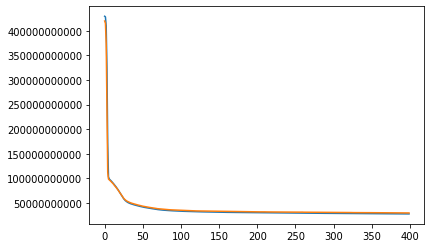

In [51]:
plt.ticklabel_format(style='plain')
plt.plot(losses)

<AxesSubplot:>

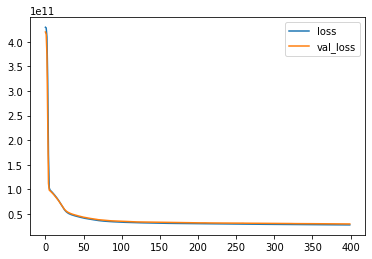

In [52]:
losses.plot()

In [54]:
y_pred = model.predict(X_test)
print(eval_metrics(y_test, y_pred))

r2_score: 0.7759061942383542 
 mae: 105875.52143389398 
 mse: 29714494866.84781 
 rmse: 172378.9281404424
None


<AxesSubplot:>

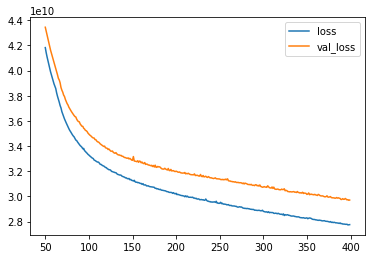

In [56]:
losses.iloc[50:].plot()

In [59]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score
y_pred = model.predict(X_test)
print('mae', mean_absolute_error(y_test, y_pred))
print('mse', np.sqrt(mean_squared_error(y_test,y_pred)))
print('explained_variance_score', explained_variance_score(y_test,y_pred))

mae 105875.52143389398
mse 172378.9281404424
explained_variance_score 0.7759761297108465


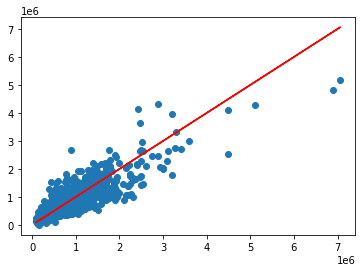

In [61]:
# Our predictions
plt.scatter(y_test,y_pred)
# Perfect predictions
plt.plot(y_test,y_test,'r')

/Users/me/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

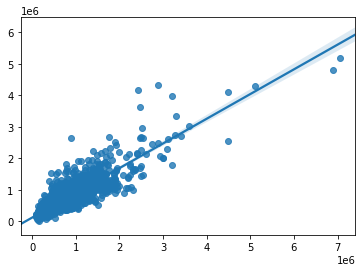

In [63]:
sns.regplot(y_test,y_pred,truncate=False)


In [68]:
single_house = df.drop('price',axis=1).iloc[0]
single_house


bedrooms           3.000
bathrooms          1.000
sqft_living     1180.000
sqft_lot        5650.000
floors             1.000
waterfront         0.000
view               0.000
condition          3.000
grade              7.000
sqft_above      1180.000
sqft_basement      0.000
yr_built        1955.000
yr_renovated       0.000
lat               47.511
long            -122.257
sqft_living15   1340.000
sqft_lot15      5650.000
month             10.000
year            2014.000
Name: 0, dtype: float64

In [69]:
single_house = scaler.transform(single_house.values.reshape(-1, 19))

model.predict(single_house)[0]
print(df.iloc[0])

array([290162.06], dtype=float32)

In [70]:
df.iloc[0]

price           221900.000
bedrooms             3.000
bathrooms            1.000
sqft_living       1180.000
sqft_lot          5650.000
floors               1.000
waterfront           0.000
view                 0.000
condition            3.000
grade                7.000
sqft_above        1180.000
sqft_basement        0.000
yr_built          1955.000
yr_renovated         0.000
lat                 47.511
long              -122.257
sqft_living15     1340.000
sqft_lot15        5650.000
month               10.000
year              2014.000
Name: 0, dtype: float64

In [72]:
X.shape[1]

19

Epoch 1/400
119/119 [==============================] - 1s 4ms/step - loss: 540873.6193 - val_loss: 514282.9688
Epoch 2/400
119/119 [==============================] - 0s 3ms/step - loss: 399387.9417 - val_loss: 181752.7656
Epoch 3/400
119/119 [==============================] - 0s 3ms/step - loss: 184214.1616 - val_loss: 172159.8750
Epoch 4/400
119/119 [==============================] - 0s 4ms/step - loss: 171785.4280 - val_loss: 160700.2344
Epoch 5/400
119/119 [==============================] - 0s 3ms/step - loss: 158587.1625 - val_loss: 145149.8438
Epoch 6/400
119/119 [==============================] - 0s 3ms/step - loss: 141808.9671 - val_loss: 130290.6797
Epoch 7/400
119/119 [==============================] - 0s 4ms/step - loss: 130491.3240 - val_loss: 124059.0625
Epoch 8/400
119/119 [==============================] - 0s 3ms/step - loss: 126320.4808 - val_loss: 120330.2422
Epoch 9/400
119/119 [==============================] - 0s 4ms/step - loss: 120014.8449 - val_loss: 118815.5078
E

119/119 [==============================] - 0s 4ms/step - loss: 103905.8246 - val_loss: 105199.0625
Epoch 75/400
119/119 [==============================] - 0s 3ms/step - loss: 104048.7885 - val_loss: 105200.8359
Epoch 76/400
119/119 [==============================] - 0s 3ms/step - loss: 106600.8555 - val_loss: 105027.1094
Epoch 77/400
119/119 [==============================] - 0s 3ms/step - loss: 104071.9679 - val_loss: 104905.2266
Epoch 78/400
119/119 [==============================] - 0s 3ms/step - loss: 101682.8467 - val_loss: 105113.8672
Epoch 79/400
119/119 [==============================] - 0s 3ms/step - loss: 102118.3826 - val_loss: 104699.5781
Epoch 80/400
119/119 [==============================] - 0s 3ms/step - loss: 102947.9851 - val_loss: 104758.8672
Epoch 81/400
119/119 [==============================] - 0s 3ms/step - loss: 104890.1686 - val_loss: 104620.0234
Epoch 82/400
119/119 [==============================] - 0s 4ms/step - loss: 103394.8130 - val_loss: 105471.2656
Epoch

Epoch 147/400
119/119 [==============================] - 0s 4ms/step - loss: 99820.1207 - val_loss: 101740.0234
Epoch 148/400
119/119 [==============================] - 0s 3ms/step - loss: 100083.9199 - val_loss: 102237.2109
Epoch 149/400
119/119 [==============================] - 0s 4ms/step - loss: 101531.4296 - val_loss: 101606.2891
Epoch 150/400
119/119 [==============================] - 0s 3ms/step - loss: 99230.1277 - val_loss: 101904.8906
Epoch 151/400
119/119 [==============================] - 1s 5ms/step - loss: 99739.1425 - val_loss: 101683.2656
Epoch 152/400
119/119 [==============================] - 0s 4ms/step - loss: 99684.3557 - val_loss: 102227.4688
Epoch 153/400
119/119 [==============================] - 0s 3ms/step - loss: 100665.6132 - val_loss: 101481.6406
Epoch 154/400
119/119 [==============================] - 0s 3ms/step - loss: 102086.6887 - val_loss: 101582.0938
Epoch 155/400
119/119 [==============================] - 0s 4ms/step - loss: 102295.6592 - val_loss:

Epoch 220/400
119/119 [==============================] - 0s 3ms/step - loss: 98223.9236 - val_loss: 100359.7812
Epoch 221/400
119/119 [==============================] - 0s 3ms/step - loss: 97568.0938 - val_loss: 100343.3359
Epoch 222/400
119/119 [==============================] - 0s 3ms/step - loss: 97632.9440 - val_loss: 100706.8281
Epoch 223/400
119/119 [==============================] - 0s 3ms/step - loss: 99305.2936 - val_loss: 100932.4453
Epoch 224/400
119/119 [==============================] - 0s 3ms/step - loss: 98878.5430 - val_loss: 100770.3125
Epoch 225/400
119/119 [==============================] - 0s 3ms/step - loss: 98977.0406 - val_loss: 100778.8828
Epoch 226/400
119/119 [==============================] - 0s 3ms/step - loss: 97301.7669 - val_loss: 100382.8672
Epoch 227/400
119/119 [==============================] - 0s 3ms/step - loss: 98358.4463 - val_loss: 100826.7422
Epoch 228/400
119/119 [==============================] - 0s 3ms/step - loss: 98899.1374 - val_loss: 1003

119/119 [==============================] - 1s 4ms/step - loss: 83530.4954 - val_loss: 84284.6484
Epoch 294/400
119/119 [==============================] - 0s 4ms/step - loss: 82880.8757 - val_loss: 83847.1797
Epoch 295/400
119/119 [==============================] - 0s 3ms/step - loss: 82992.0525 - val_loss: 83795.2422
Epoch 296/400
119/119 [==============================] - 0s 4ms/step - loss: 82028.8588 - val_loss: 84010.4766
Epoch 297/400
119/119 [==============================] - 1s 4ms/step - loss: 81304.3604 - val_loss: 84274.9766
Epoch 298/400
119/119 [==============================] - 1s 6ms/step - loss: 83348.7326 - val_loss: 83018.7188
Epoch 299/400
119/119 [==============================] - 0s 3ms/step - loss: 82455.3033 - val_loss: 83178.8359
Epoch 300/400
119/119 [==============================] - 0s 4ms/step - loss: 80382.2480 - val_loss: 82392.8125
Epoch 301/400
119/119 [==============================] - 0s 3ms/step - loss: 81879.0235 - val_loss: 82245.6016
Epoch 302/400
1

119/119 [==============================] - 0s 4ms/step - loss: 75856.8160 - val_loss: 78336.6094
Epoch 367/400
119/119 [==============================] - 0s 4ms/step - loss: 76111.2688 - val_loss: 77836.8516
Epoch 368/400
119/119 [==============================] - 0s 3ms/step - loss: 75289.2790 - val_loss: 78691.3906
Epoch 369/400
119/119 [==============================] - 0s 3ms/step - loss: 78486.4888 - val_loss: 77484.0234
Epoch 370/400
119/119 [==============================] - 0s 3ms/step - loss: 75898.5682 - val_loss: 78033.2812
Epoch 371/400
119/119 [==============================] - 0s 3ms/step - loss: 75043.8304 - val_loss: 77533.4453
Epoch 372/400
119/119 [==============================] - 0s 3ms/step - loss: 76365.0372 - val_loss: 77570.7500
Epoch 373/400
119/119 [==============================] - 0s 3ms/step - loss: 75334.6479 - val_loss: 79300.0781
Epoch 374/400
119/119 [==============================] - 0s 3ms/step - loss: 75544.0229 - val_loss: 77776.5469
Epoch 375/400
1

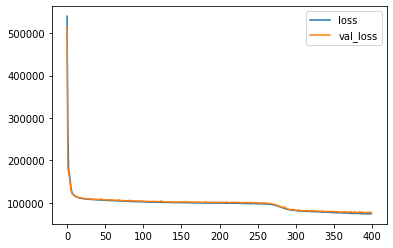

mae 75804.16269290124
mse 138591.06771173517
explained_variance_score 0.8561852197154742


In [73]:
model = Sequential()

model.add(Dense(19, activation='relu')) #input layer

model.add(Dense(64, activation='relu')) #hidden layer 1
model.add(Dense(64, activation='relu')) #hidden layer 2
model.add(Dense(64, activation='relu')) #hidden layer 3
model.add(Dense(64, activation='relu')) #hidden layer 3

model.add(Dense(1)) #output layer, single since we do a regresion

model.compile(optimizer = 'adam', loss='mean_absolute_error')

model.fit(X_train, y_train,validation_data=(X_test, y_test), batch_size=128, epochs=400) 
print(model.summary())

losses = pd.DataFrame(model.history.history)
losses.plot()
plt.show()

from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score
y_pred = model.predict(X_test)
print('mae', mean_absolute_error(y_test, y_pred))
print('mse', np.sqrt(mean_squared_error(y_test,y_pred)))
print('explained_variance_score', explained_variance_score(y_test,y_pred))

In [76]:
single_house = df.drop('price',axis=1).iloc[0]
single_house = scaler.transform(single_house.values.reshape(-1, 19))

print(model.predict(single_house)[0])
print(df.iloc[0])

[241982.1]
price           221900.000
bedrooms             3.000
bathrooms            1.000
sqft_living       1180.000
sqft_lot          5650.000
floors               1.000
waterfront           0.000
view                 0.000
condition            3.000
grade                7.000
sqft_above        1180.000
sqft_basement        0.000
yr_built          1955.000
yr_renovated         0.000
lat                 47.511
long              -122.257
sqft_living15     1340.000
sqft_lot15        5650.000
month               10.000
year              2014.000
Name: 0, dtype: float64
